In [309]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" 
import pandas as pd
import numpy as np
import datetime as dt
import seaborn as sns
import statistics as stt
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import re
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
pd.options.display.max_rows

C:\Users\Admin\AppData\Local\Temp/ipykernel_15616/2468422413.py:16: FutureWarning:

Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.



Lưu ý: Pipeline: -> Nhập dl -> Vẽ boxplot, distribution -> Điền missing -> Phân tích (Phân tích trước để đo lường sự thay đổi của thời gian) -> Xử lý Outlier (điền khuyết nội suy để tạo ra một điểm bình thường) -> Phân tích tiếp -> ANOVA (X) thay vào đó là có thể là sử dụng một cái gì đó để select thuộc tính -> Xây dựng mô hình

# Read DATA

In [311]:
data=pd.read_csv(r'T:\FilesHocTap\DS105_final_project\DS105.M11\all new\final_data.csv',index_col=0)

In [254]:
data.sample(5)

,Time,Country Name,Region,"Population, total",Population Structure,Population growth,"Unemployment, total (% of total labor force) (modeled ILO estimate)","Labor force, total",Life expectancy index,Life expectancy at birth (Times),HDI,Highest GDP contribution industry rate,Industry has the highest employment contribution rate,"Agriculture, forestry, and fishing, value added (annual % growth)","Industry (including construction), value added (annual % growth)","Services, value added (annual % growth)","Manufacturing, value added (annual % growth)",Gross value added at basic prices (GVA) (current US$),Total natural resources rents (% of GDP),"Inflation, GDP deflator (annual %)",GNI growth (annual %),Adjusted savings (% of GNI),"Stocks traded, total value (% of GDP)",Broad money (% of GDP),Consumer price index (2010 = 100),Net ODA received (% of GNI),"Foreign direct investment, net inflows (% of GDP)","Official exchange rate (LCU per US$, period average)","Total reserves (includes gold, current US$)","Central government debt, total (% of GDP)",Trade (% of GDP),Lending interest rate (%),Deposit interest rate (%),Import value index (2000 = 100),Type has the highest manufacturing contribution rate,Type has the highest service import contribution rate,Type has the highest commercial service import contribution rate,Type has the highest merchandise import contribution rate,Export value index (2000 = 100),Type has the highest service export contribution rate,Type has the highest merchandise export contribution rate,Type has the highest commercial service export contribution rate,Education Index,Documents,H index,Expected Times of schooling (Times),Mean Times of schooling (Times),GDP growth (annual %)
664,2003,Bahamas,Latin America & Caribbean,313123.0,Old,1-2,10.84,168458.0,0.800,72.0,High,Services,Services,9.677419,51.567819,-3.033366,28.659612,8.309900e+09,0.007119,1.154479,-0.821670,gross savings,NaN,43.772949,85.943115,NaN,2.144285,1.000000,4.911086e+08,NaN,71.063541,6.000000,3.949167,84.972994,NaN,"Communications, computer, etc","Communications, computer and other service",Manufactures,73.797534,Travel services,Food,Travel services,0.706,11.0,55.0,12.3,10.9,-1.264526
2487,2011,Kazakhstan,Europe & Central Asia,16557202.0,Old,1-2,5.39,8808571.0,0.739,68.0,High,Services,Services,26.500000,3.474838,9.000000,7.500000,1.755677e+11,27.192306,20.542958,3.066015,gross savings,0.283315,34.529680,108.424888,0.121924,7.143509,146.620833,2.921528e+10,8.80131,73.117857,NaN,NaN,732.257937,Other manufacturing,"Communications, computer, etc","Communications, computer and other service",Manufactures,957.035700,Transport services,Fuel,Transport services,0.791,578.0,126.0,14.7,11.5,7.400000
2019,2009,Fiji,East Asia & Pacific,853636.0,Old,0-1,4.20,365216.0,0.716,66.6,High,Services,Services,-8.090669,1.042939,-0.817891,-1.361535,2.447210e+09,1.175883,1.390695,NaN,gross savings,NaN,70.126357,96.442234,2.322711,10.742391,1.958095,5.700051e+08,NaN,106.044652,7.853416,4.912848,173.465422,"Food, beverages and tobacco",Transport services,Transport services,Manufactures,107.636581,Travel services,Food,Travel services,0.723,158.0,101.0,14.6,9.5,-1.386038
3692,2017,American Samoa,East Asia & Pacific,55617.0,NaN,-0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-20.192308,NaN,0.000000,-1.940890,NaN,education expenditure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,161.437908,NaN,NaN,117.588933,NaN,NaN,NaN,NaN,114.580142,NaN,NaN,NaN,NaN,11.0,31.0,NaN,NaN,-6.987578
2207,2010,Central African Republic,Sub-Saharan Africa,4386765.0,Young,1-2,4.38,1784396.0,0.420,47.3,Low,"Agriculture, forestry, and fishing",Agriculture,2.962097,-1.741203,9.103892,4.930152,1.999096e+09,7.908127,4.211309,5.396860,consumption of fixed capital,NaN,16.511467,100.000000,12.126001,2.871289,494.794262,1.811755e+08,NaN,34.430482,NaN,3.250000,256.410256,NaN,NaN,NaN,Manufactures,86.956522,NaN,Ores and metals,NaN,0.307,31.0,59.0,6.8,3.6,4.630818


# Basic info

In [133]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4557 entries, 0 to 4556
Data columns (total 48 columns):
 #   Column                                                               Non-Null Count  Dtype  
---  ------                                                               --------------  -----  
 0   Time                                                                 4557 non-null   int64  
 1   Country Name                                                         4557 non-null   object 
 2   Region                                                               4557 non-null   object 
 3   Population, total                                                    4548 non-null   float64
 4   Population Structure                                                 4065 non-null   object 
 5   Population growth                                                    4548 non-null   object 
 6   Unemployment, total (% of total labor force) (modeled ILO estimate)  3927 non-null   float64
 7   Labor 

In [134]:
data.dtypes

Time                                                                   int64  
Country Name                                                           object 
Region                                                                 object 
Population, total                                                      float64
Population Structure                                                   object 
Population growth                                                      object 
Unemployment, total (% of total labor force) (modeled ILO estimate)    float64
Labor force, total                                                     float64
Life expectancy index                                                  float64
Life expectancy at birth (Times)                                       float64
HDI                                                                    object 
Highest GDP contribution industry rate                                 object 
Industry has the highest employment contribution rat

In [135]:
data.describe()

,Time,"Population, total","Unemployment, total (% of total labor force) (modeled ILO estimate)","Labor force, total",Life expectancy index,Life expectancy at birth (Times),"Agriculture, forestry, and fishing, value added (annual % growth)","Industry (including construction), value added (annual % growth)","Services, value added (annual % growth)","Manufacturing, value added (annual % growth)",Gross value added at basic prices (GVA) (current US$),Total natural resources rents (% of GDP),"Inflation, GDP deflator (annual %)",GNI growth (annual %),"Stocks traded, total value (% of GDP)",Broad money (% of GDP),Consumer price index (2010 = 100),Net ODA received (% of GNI),"Foreign direct investment, net inflows (% of GDP)","Official exchange rate (LCU per US$, period average)","Total reserves (includes gold, current US$)","Central government debt, total (% of GDP)",Trade (% of GDP),Lending interest rate (%),Deposit interest rate (%),Import value index (2000 = 100),Export value index (2000 = 100),Education Index,Documents,H index,Expected Times of schooling (Times),Mean Times of schooling (Times),GDP growth (annual %)
count,4557.000000,4.548000e+03,3927.000000,3.927000e+03,3820.000000,3820.000000,3760.000000,3642.000000,3601.000000,3588.000000,3.673000e+03,4061.000000,4229.000000,2950.000000,1571.000000,3266.000000,3741.000000,2744.000000,3806.000000,3.774000e+03,3.603000e+03,774.000000,3829.000000,2697.000000,2771.000000,4040.000000,4040.000000,3692.000000,4371.000000,4371.000000,3788.000000,3706.000000,4230.000000
mean,2010.000000,3.187135e+07,8.008930,1.672702e+07,0.764843,69.714424,2.292232,3.629455,3.893269,3.300538,2.711717e+11,6.626974,7.015334,3.488121,35.462705,57.758876,118.418585,6.276003,9.664764,1.782082e+06,5.080259e+10,53.302749,92.407127,13.051952,6.097931,293.284064,314.427739,0.610943,13527.760467,260.953558,12.473997,7.929978,3.280685
std,6.055965,1.276042e+08,5.962658,6.716317e+07,0.140638,9.141852,9.156197,10.483036,5.793743,12.238329,1.177461e+12,11.177208,43.625813,5.040177,75.215214,44.423959,455.169602,9.054157,68.012023,1.094373e+08,2.251095e+11,32.735020,59.699118,9.831681,7.733380,218.000230,539.127589,0.181485,55902.482185,339.800705,3.097548,3.164318,5.707211
min,2000.000000,9.392000e+03,0.110000,3.120500e+04,0.299000,39.400000,-45.850916,-75.045642,-33.233197,-80.074608,0.000000e+00,0.000000,-30.199654,-36.160657,0.000858,2.857408,2.909082,-2.312579,-1275.189986,4.446838e-02,2.677074e+05,0.018398,0.167418,0.000000,-0.383657,25.404192,0.196657,0.116000,1.000000,10.000000,2.900000,1.100000,-62.075920
25%,2005.000000,6.728410e+05,3.780000,1.004878e+06,0.678000,64.100000,-1.321266,-0.293782,1.621037,-0.556860,4.546364e+09,0.121496,1.365053,1.327220,1.347523,28.316825,81.944438,0.522999,1.242650,2.271157e+00,6.323320e+08,29.159834,56.688934,7.024849,2.450000,139.352220,117.862989,0.474000,46.000000,64.000000,10.600000,5.300000,1.205786
50%,2010.000000,5.653914e+06,6.440000,3.395033e+06,0.799000,72.000000,2.562405,3.224221,3.829613,3.073268,1.857626e+10,1.516351,3.544789,3.540888,8.066023,46.962555,100.000000,2.857181,3.000783,1.124122e+01,3.524350e+09,48.853665,81.257523,10.720000,4.460000,225.203243,207.048309,0.637000,367.000000,122.000000,12.600000,8.100000,3.479276
75%,2015.000000,2.014812e+07,10.740000,1.007718e+07,0.866000,76.300000,5.771474,7.104748,6.302979,6.797056,1.221021e+11,7.948564,7.807369,5.975397,42.127188,73.456867,113.475546,8.347276,6.137897,1.523671e+02,2.495390e+10,68.739693,110.667405,16.186944,8.000000,378.898236,353.275354,0.749000,3876.500000,290.000000,14.600000,10.600000,5.820382
max,2020.000000,1.402112e+09,37.250000,7.871832e+08,0.998000,84.900000,91.606197,162.671358,97.465837,375.157680,1.983795e+13,87.459309,2630.122674,47.977040,952.667323,452.548038,20422.893371,92.141460,1704.590134,6.723052e+09,3.900039e+12,194.823099,860.800000,118.379941,203.375000,1909.586541,14708.270350,0.943000,788287.000000,2577.000000,23.300000,14.200000,123.139555


In [136]:
# Chuyển đổi các ký hiệu missing data như '?', '??', ... sang nan.
data.replace(to_replace=['?','??','.','..','','_','nan','Na','NULL','null','not','Not'], value= np.nan, inplace=True)

In [137]:
list(data.columns)

['Time',
 'Country Name',
 'Region',
 'Population, total',
 'Population Structure',
 'Population growth',
 'Unemployment, total (% of total labor force) (modeled ILO estimate)',
 'Labor force, total',
 'Life expectancy index',
 'Life expectancy at birth (Times)',
 'HDI',
 'Highest GDP contribution industry rate',
 'Industry has the highest employment contribution rate',
 'Agriculture, forestry, and fishing, value added (annual % growth)',
 'Industry (including construction), value added (annual % growth)',
 'Services, value added (annual % growth)',
 'Manufacturing, value added (annual % growth)',
 'Gross value added at basic prices (GVA) (current US$)',
 'Total natural resources rents (% of GDP)',
 'Inflation, GDP deflator (annual %)',
 'GNI growth (annual %)',
 'Adjusted savings (% of GNI)',
 'Stocks traded, total value (% of GDP)',
 'Broad money (% of GDP)',
 'Consumer price index (2010 = 100)',
 'Net ODA received (% of GNI)',
 'Foreign direct investment, net inflows (% of GDP)',
 '

In [138]:
data.loc[np.logical_and(data['Central government debt, total (% of GDP)'].notna(),data['Time']>=2016),['Country Name','Time']]

,Country Name,Time
3473,Albania,2016
3482,Australia,2016
3485,Bahamas,2016
3489,Belarus,2016
3494,Bhutan,2016
3496,Bosnia and Herzegovina,2016
3497,Botswana,2016
3498,Brazil,2016
3514,Colombia,2016
3531,El Salvador,2016


<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='Features', ylabel='% Missing Values'>

Text(0.5, 1.0, '% Missing Values')

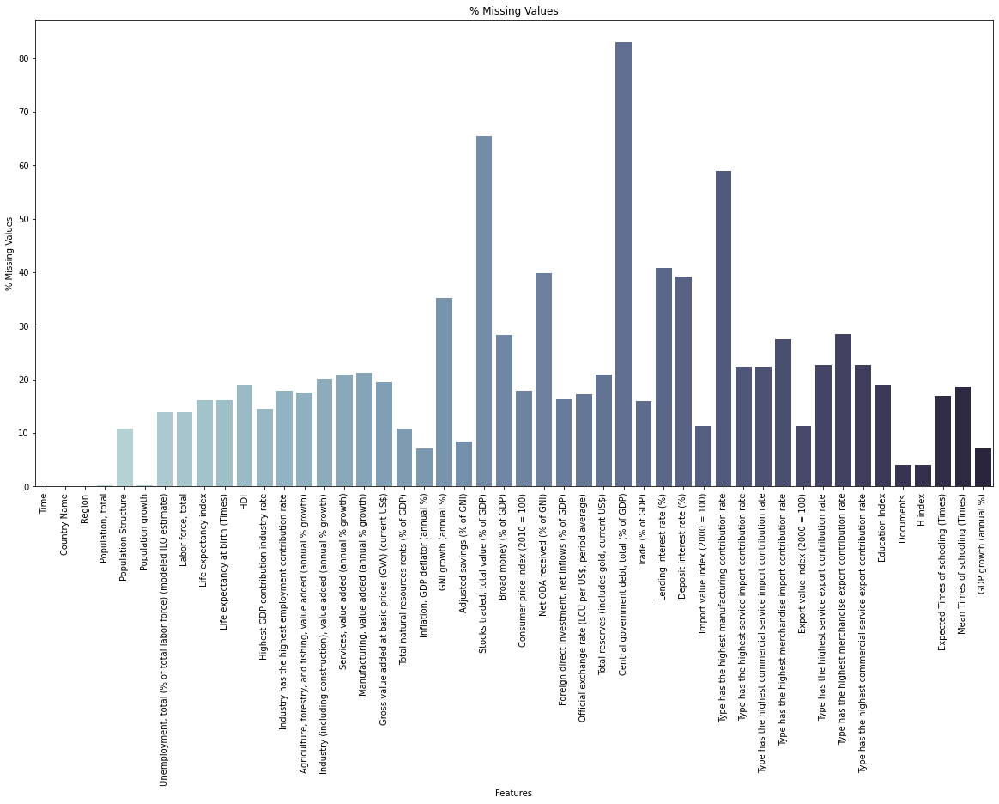

In [139]:
missing=list((data.isna().sum()/len(data.index))*100)
feature=list(data.columns)

plt.figure(figsize=(20,10))
sns.barplot(data=pd.DataFrame(list(zip(feature, missing)),columns=['Features','% Missing Values']),x='Features',y='% Missing Values',palette='ch:start=.2,rot=-.3')
plt.tick_params(axis='x', rotation=90)
plt.title('% Missing Values')

# Trực quan cơ bản

## Đồ thị box plot, phân phối, tuyến tính, ma trận tương quan, ... chưa phân tích

In [350]:
data_numeric=data.select_dtypes(exclude=object)

data_cate=data.select_dtypes(include=object)

In [141]:
data[data.columns[1:]].corr()['GDP growth (annual %)'][:-1]

Population, total                                                      0.074741
Unemployment, total (% of total labor force) (modeled ILO estimate)   -0.106138
Labor force, total                                                     0.073004
Life expectancy index                                                 -0.123827
Life expectancy at birth (Times)                                      -0.123863
Agriculture, forestry, and fishing, value added (annual % growth)      0.267088
Industry (including construction), value added (annual % growth)       0.612896
Services, value added (annual % growth)                                0.688623
Manufacturing, value added (annual % growth)                           0.333321
Gross value added at basic prices (GVA) (current US$)                 -0.058206
Total natural resources rents (% of GDP)                               0.155311
Inflation, GDP deflator (annual %)                                    -0.015430
GNI growth (annual %)                   

In [142]:
data_numeric.iloc[:,1:].corr()

,"Population, total","Unemployment, total (% of total labor force) (modeled ILO estimate)","Labor force, total",Life expectancy index,Life expectancy at birth (Times),"Agriculture, forestry, and fishing, value added (annual % growth)","Industry (including construction), value added (annual % growth)","Services, value added (annual % growth)","Manufacturing, value added (annual % growth)",Gross value added at basic prices (GVA) (current US$),Total natural resources rents (% of GDP),"Inflation, GDP deflator (annual %)",GNI growth (annual %),"Stocks traded, total value (% of GDP)",Broad money (% of GDP),Consumer price index (2010 = 100),Net ODA received (% of GNI),"Foreign direct investment, net inflows (% of GDP)","Official exchange rate (LCU per US$, period average)","Total reserves (includes gold, current US$)","Central government debt, total (% of GDP)",Trade (% of GDP),Lending interest rate (%),Deposit interest rate (%),Import value index (2000 = 100),Export value index (2000 = 100),Education Index,Documents,H index,Expected Times of schooling (Times),Mean Times of schooling (Times),GDP growth (annual %)
"Population, total",1.000000,-0.091509,0.977345,0.019342,0.019318,0.022238,0.035298,0.081706,0.020906,0.331380,-0.024248,0.001384,0.090846,0.139142,0.185471,-0.002435,-0.132573,-0.027209,-0.002777,0.640502,0.039552,-0.172238,-0.050060,-0.006373,0.140481,0.036913,-0.038064,0.525935,0.318155,-0.028337,-0.042005,0.074741
"Unemployment, total (% of total labor force) (modeled ILO estimate)",-0.091509,1.000000,-0.093521,-0.022160,-0.022198,-0.019923,-0.091475,-0.115960,-0.015957,-0.060283,-0.077230,-0.013678,-0.142400,-0.119926,-0.062968,0.024359,-0.116643,0.003991,-0.009148,-0.090461,0.124167,0.001909,0.008574,0.005380,-0.126435,-0.068629,0.111140,-0.052428,-0.063601,0.098168,0.110155,-0.106138
"Labor force, total",0.977345,-0.093521,1.000000,0.046801,0.046768,0.019442,0.038160,0.078208,0.019649,0.406305,-0.049611,-0.004563,0.094700,0.151296,0.226021,-0.004157,-0.127353,-0.043179,-0.002899,0.719825,0.054067,-0.149718,-0.065386,-0.026606,0.116499,0.028149,-0.009681,0.560613,0.318577,-0.003160,-0.013923,0.073004
Life expectancy index,0.019342,-0.022160,0.046801,1.000000,0.999993,-0.054120,-0.117796,-0.163599,-0.088424,0.204422,-0.285564,-0.099408,-0.165387,0.255717,0.549263,-0.022174,-0.339049,0.075676,-0.043002,0.163921,0.303275,0.249045,-0.354011,-0.259125,-0.081365,-0.095490,0.795677,0.230433,0.474630,0.786609,0.740697,-0.123827
Life expectancy at birth (Times),0.019318,-0.022198,0.046768,0.999993,1.000000,-0.054180,-0.117809,-0.163709,-0.088468,0.204490,-0.285560,-0.099447,-0.165402,0.255818,0.549292,-0.022068,-0.339127,0.075694,-0.043038,0.163864,0.302921,0.248988,-0.354048,-0.259111,-0.081396,-0.095534,0.795619,0.230470,0.474662,0.786591,0.740619,-0.123863
"Agriculture, forestry, and fishing, value added (annual % growth)",0.022238,-0.019923,0.019442,-0.054120,-0.054180,1.000000,0.048416,0.195213,0.097334,-0.017592,0.073848,-0.017894,0.244750,-0.061588,-0.084364,-0.020951,0.009896,-0.002887,-0.081951,-0.010049,-0.033208,-0.048794,0.041523,-0.019696,0.081455,0.053295,-0.060828,-0.014197,-0.041476,-0.058302,-0.058165,0.267088
"Industry (including construction), value added (annual % growth)",0.035298,-0.091475,0.038160,-0.117796,-0.117809,0.048416,1.000000,0.254033,0.362814,-0.045690,0.095173,0.016455,0.488429,-0.023788,-0.112177,-0.036329,0.034316,-0.011950,-0.041684,-0.002374,-0.106006,0.023788,0.056151,-0.019256,0.092661,0.199850,-0.136773,-0.040406,-0.088321,-0.138684,-0.123821,0.612896
"Services, value added (annual % growth)",0.081706,-0.115960,0.078208,-0.163599,-0.163709,0.195213,0.254033,1.000000,0.224889,-0.063101,0.199055,-0.033023,0.541473,-0.027515,-0.121523,-0.116270,0.030131,-0.025124,-0.028553,0.015164,-0.216906,0.017071,0.033460,-0.029488,0.133385,0.061993,-0.183230,-0.047738,-0.100313,-0.188911,-0.167199,0.688623
"Manufacturing, value added (annual % growth)",0.020906,-0.015957,0.019649,-0.088424,-0.088468,0.

<AxesSubplot:xlabel='Population, total'>

<AxesSubplot:xlabel='Unemployment, total (% of total labor force) (modeled ILO estimate)'>

<AxesSubplot:xlabel='Labor force, total'>

<AxesSubplot:xlabel='Life expectancy index'>

<AxesSubplot:xlabel='Life expectancy at birth (Times)'>

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)'>

<AxesSubplot:xlabel='Industry (including construction), value added (annual % growth)'>

<AxesSubplot:xlabel='Services, value added (annual % growth)'>

<AxesSubplot:xlabel='Manufacturing, value added (annual % growth)'>

<AxesSubplot:xlabel='Gross value added at basic prices (GVA) (current US$)'>

<AxesSubplot:xlabel='Total natural resources rents (% of GDP)'>

<AxesSubplot:xlabel='Inflation, GDP deflator (annual %)'>

<AxesSubplot:xlabel='GNI growth (annual %)'>

<AxesSubplot:xlabel='Stocks traded, total value (% of GDP)'>

<AxesSubplot:xlabel='Broad money (% of GDP)'>

<AxesSubplot:xlabel='Consumer price index (2010 = 100)'>

<AxesSubplot:xlabel='Net ODA received (% of GNI)'>

<AxesSubplot:xlabel='Foreign direct investment, net inflows (% of GDP)'>

<AxesSubplot:xlabel='Official exchange rate (LCU per US$, period average)'>

<AxesSubplot:xlabel='Total reserves (includes gold, current US$)'>

<AxesSubplot:xlabel='Trade (% of GDP)'>

<AxesSubplot:xlabel='Lending interest rate (%)'>

<AxesSubplot:xlabel='Deposit interest rate (%)'>

<AxesSubplot:xlabel='Import value index (2000 = 100)'>

<AxesSubplot:xlabel='Export value index (2000 = 100)'>

<AxesSubplot:xlabel='Education Index'>

<AxesSubplot:xlabel='Documents'>

<AxesSubplot:xlabel='H index'>

<AxesSubplot:xlabel='Expected Times of schooling (Times)'>

<AxesSubplot:xlabel='Mean Times of schooling (Times)'>

<AxesSubplot:xlabel='GDP growth (annual %)'>

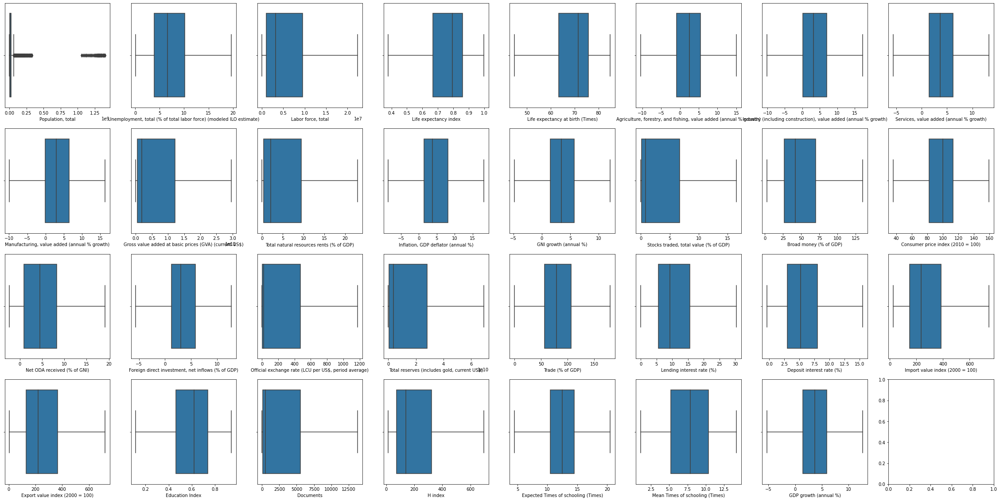

In [351]:
# Box plot
feature_list=list(data_numeric)[1:]
k=0
fig, axs = plt.subplots(4,8,figsize=(40,20))
for i in range (0,4):
    for j in range (0,8):
        if k!=31:
            sns.boxplot(ax=axs[i,j],data=data_numeric,x=feature_list[k])
            k+=1

plt.show()

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Population, total')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Unemployment, total (% of total labor force) (modeled ILO estimate)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Labor force, total')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Life expectancy index')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Life expectancy at birth (Times)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Agriculture, forestry, and fishing, value added (annual % growth)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Industry (including construction), value added (annual % growth)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Services, value added (annual % growth)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Manufacturing, value added (annual % growth)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Gross value added at basic prices (GVA) (current US$)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Total natural resources rents (% of GDP)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Inflation, GDP deflator (annual %)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'GNI growth (annual %)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Stocks traded, total value (% of GDP)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Broad money (% of GDP)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Consumer price index (2010 = 100)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Net ODA received (% of GNI)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Foreign direct investment, net inflows (% of GDP)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Official exchange rate (LCU per US$, period average)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Total reserves (includes gold, current US$)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Central government debt, total (% of GDP)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Trade (% of GDP)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Lending interest rate (%)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Deposit interest rate (%)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Import value index (2000 = 100)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Export value index (2000 = 100)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Education Index')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Documents')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'H index')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Expected Times of schooling (Times)')

C:\Users\Admin\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Mean Times of schooling (Times)')

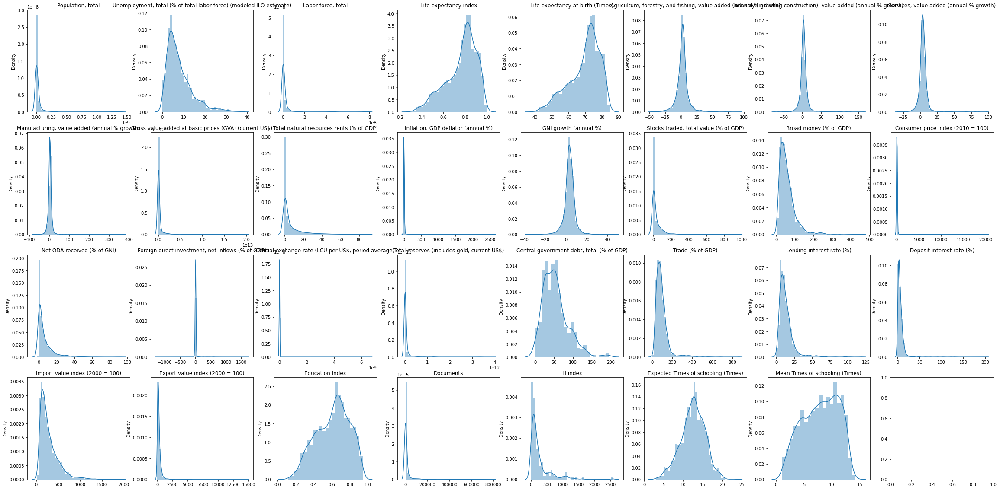

In [144]:
# Distribution
feature_list=list(data_numeric)[1:]
k=0
fig, axs = plt.subplots(4,8,figsize=(40,20))
for i in range (0,4):
    for j in range (0,8):
        if k!=31:
            sns.distplot(ax=axs[i,j],label=str(feature_list[k]),x=data_numeric[feature_list[k]])
            axs[i,j].set_title(feature_list[k])
            k+=1

plt.show()

<AxesSubplot:xlabel='Population, total', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Unemployment, total (% of total labor force) (modeled ILO estimate)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Labor force, total', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Life expectancy index', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Life expectancy at birth (Times)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Industry (including construction), value added (annual % growth)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Services, value added (annual % growth)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Manufacturing, value added (annual % growth)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Gross value added at basic prices (GVA) (current US$)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Total natural resources rents (% of GDP)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Inflation, GDP deflator (annual %)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='GNI growth (annual %)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Stocks traded, total value (% of GDP)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Broad money (% of GDP)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Consumer price index (2010 = 100)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Net ODA received (% of GNI)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Foreign direct investment, net inflows (% of GDP)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Official exchange rate (LCU per US$, period average)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Total reserves (includes gold, current US$)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Central government debt, total (% of GDP)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Trade (% of GDP)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Lending interest rate (%)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Deposit interest rate (%)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Import value index (2000 = 100)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Export value index (2000 = 100)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Education Index', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Documents', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='H index', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Expected Times of schooling (Times)', ylabel='GDP growth (annual %)'>

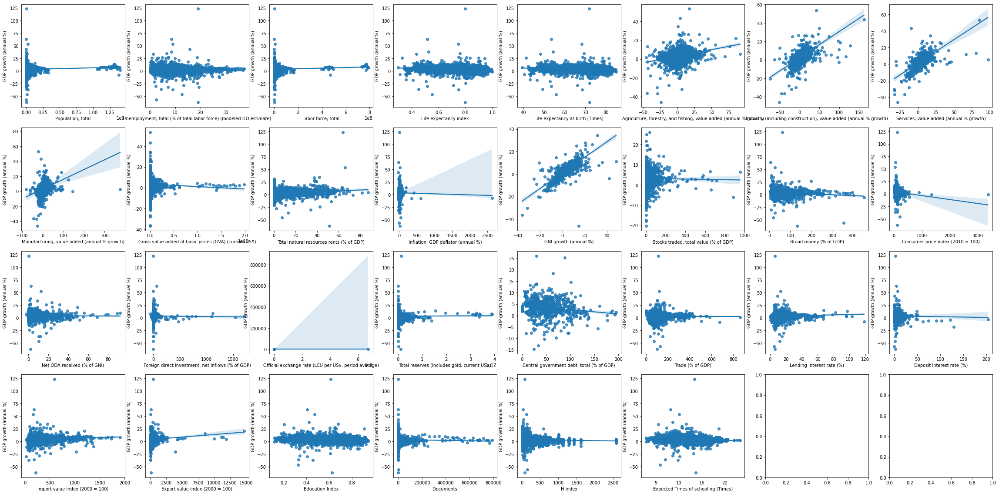

In [145]:
# regression plot
feature_list=list(data_numeric)[1:]
k=0
fig, axs = plt.subplots(4,8,figsize=(40,20))
for i in range (0,4):
    for j in range (0,8):
        if k<30:
            sns.regplot(data=data_numeric,x=feature_list[k],y='GDP growth (annual %)',ax=axs[i,j])
            k+=1

plt.show()

<Figure size 360x720 with 0 Axes>

<AxesSubplot:xlabel='Population growth', ylabel='GDP growth (annual %)'>

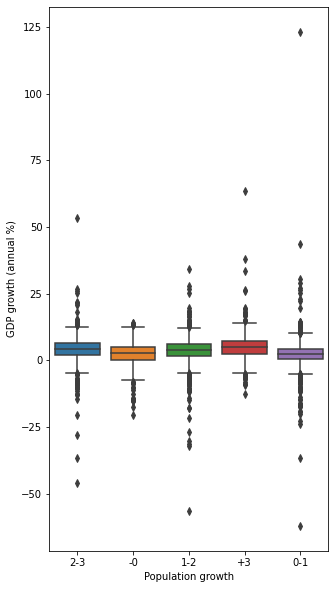

In [146]:
plt.figure(figsize=(5,10))
sns.boxplot(x=data_cate['Population growth'],y=data_numeric['GDP growth (annual %)'])

In [147]:
list(data_cate)[1:]

['Region',
 'Population Structure',
 'Population growth',
 'HDI',
 'Highest GDP contribution industry rate',
 'Industry has the highest employment contribution rate',
 'Adjusted savings (% of GNI)',
 'Type has the highest manufacturing contribution rate',
 'Type has the highest service import contribution rate',
 'Type has the highest commercial service import contribution rate',
 'Type has the highest merchandise import contribution rate',
 'Type has the highest service export contribution rate',
 'Type has the highest merchandise export contribution rate',
 'Type has the highest commercial service export contribution rate']

<AxesSubplot:xlabel='Region', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Population Structure', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Population growth', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='HDI', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Highest GDP contribution industry rate', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Industry has the highest employment contribution rate', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Adjusted savings (% of GNI)', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Type has the highest manufacturing contribution rate', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Type has the highest service import contribution rate', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Type has the highest commercial service import contribution rate', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Type has the highest merchandise import contribution rate', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Type has the highest service export contribution rate', ylabel='GDP growth (annual %)'>

<AxesSubplot:xlabel='Type has the highest merchandise export contribution rate', ylabel='GDP growth (annual %)'>

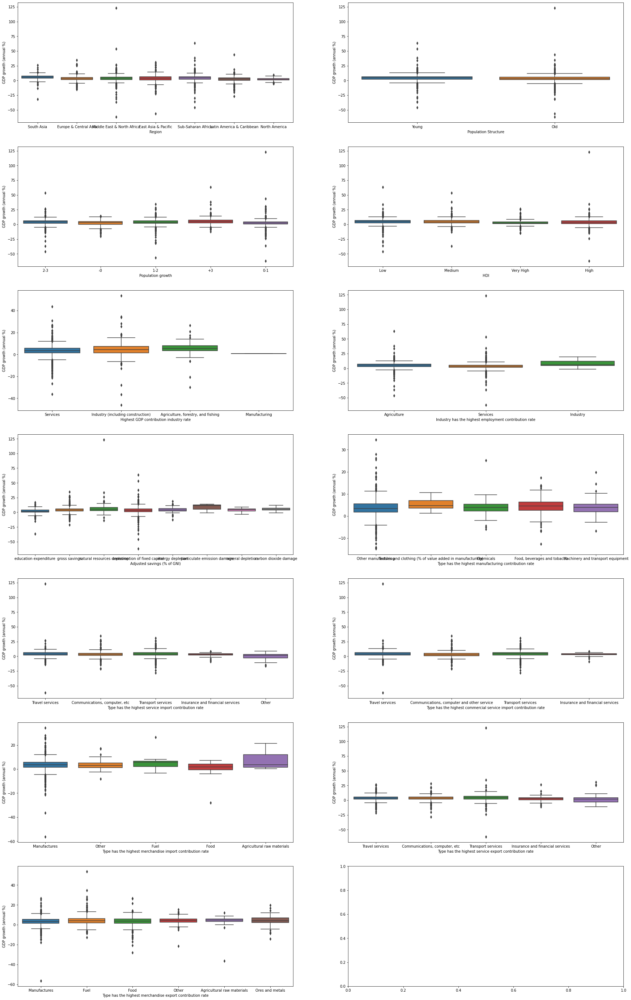

In [148]:
# box plot với các thuộc tính phân loại
feature_list=list(data_cate)[1:]
k=0
fig, axs = plt.subplots(7,2,figsize=(30,50))
for i in range (0,7):
    for j in range (0,2):
        if k<13:
            sns.boxplot(x=data_cate[feature_list[k]],y=data_numeric['GDP growth (annual %)'],ax=axs[i,j])
            k+=1

plt.show()

<AxesSubplot:xlabel='Region', ylabel='count'>

<AxesSubplot:xlabel='Population Structure', ylabel='count'>

<AxesSubplot:xlabel='Population growth', ylabel='count'>

<AxesSubplot:xlabel='HDI', ylabel='count'>

<AxesSubplot:xlabel='Highest GDP contribution industry rate', ylabel='count'>

<AxesSubplot:xlabel='Industry has the highest employment contribution rate', ylabel='count'>

<AxesSubplot:xlabel='Adjusted savings (% of GNI)', ylabel='count'>

<AxesSubplot:xlabel='Type has the highest manufacturing contribution rate', ylabel='count'>

<AxesSubplot:xlabel='Type has the highest service import contribution rate', ylabel='count'>

<AxesSubplot:xlabel='Type has the highest commercial service import contribution rate', ylabel='count'>

<AxesSubplot:xlabel='Type has the highest merchandise import contribution rate', ylabel='count'>

<AxesSubplot:xlabel='Type has the highest service export contribution rate', ylabel='count'>

<AxesSubplot:xlabel='Type has the highest merchandise export contribution rate', ylabel='count'>

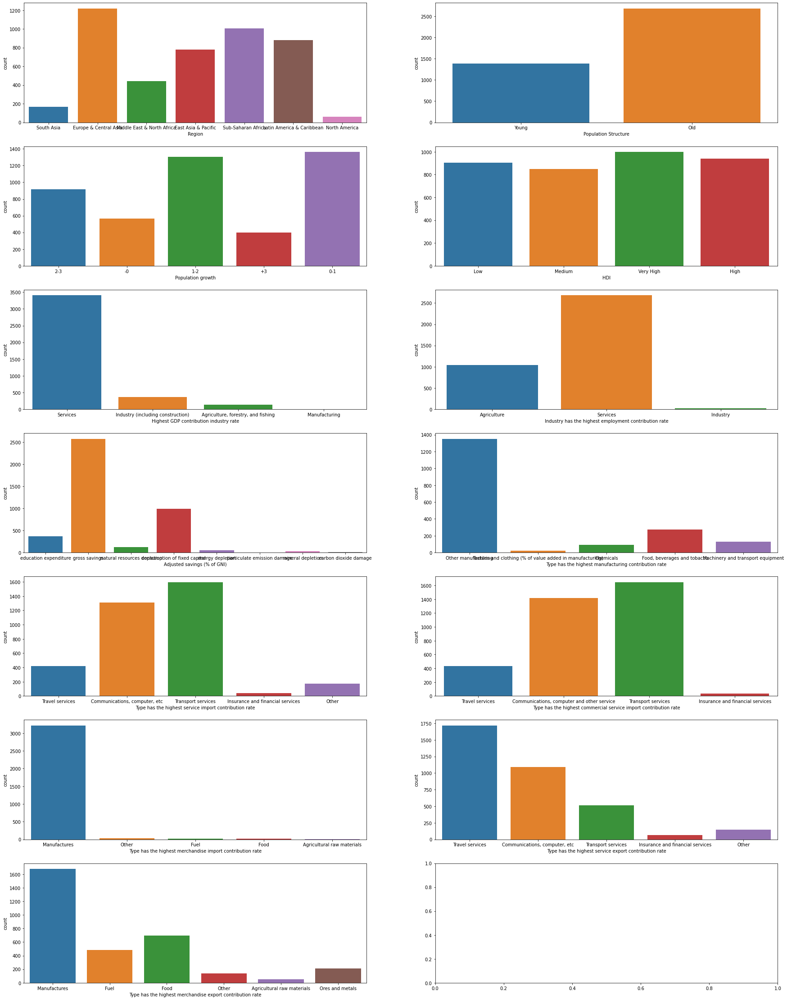

In [149]:
# bot plot với số lượng các loại trong biến
# box plot với các thuộc tính phân loại
feature_list=list(data_cate)[1:]
k=0
fig, axs = plt.subplots(7,2,figsize=(30,40))
for i in range (0,7):
    for j in range (0,2):
        if k<13:
            sns.countplot(x=feature_list[k],data=data_cate,ax=axs[i,j])
            k+=1

plt.show()
#sns.catplot(x="sex", y="survived", hue="class", kind="bar", data=titanic)

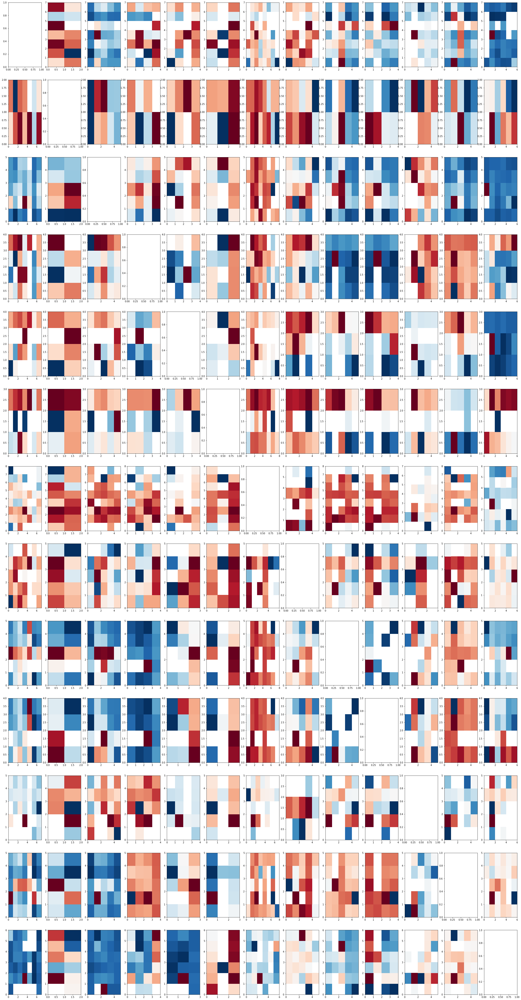

In [150]:
# box plot với các thuộc tính cate
feature_list=list(data_cate)[1:]
feature_list.append('GDP growth (annual %)')
data_cate_plot=data[feature_list]
fig, axs = plt.subplots(13,13,figsize=(40,80))
for i in range (0,13):
    for j in range (0,13):
        if i!=j:
            data_pivot=data_cate_plot.pivot_table(index=feature_list[i], columns=feature_list[j],values='GDP growth (annual %)',aggfunc='mean')
            axs[i,j].pcolor(data_pivot,cmap='RdBu')
            
plt.show()    

## Target

In [151]:
data_target_ana=data[['Time','Region','GDP growth (annual %)']]

data_target_ana_group=data_target_ana.groupby(['Time'],as_index=False).mean()
data_target_ana_group['GDP growth (annual %)'] = data_target_ana_group['GDP growth (annual %)'].round(decimals = 2)

data_target_ana_group_2=data_target_ana.groupby(['Time','Region'],as_index=False).mean()
data_target_ana_group_2['GDP growth (annual %)'] = data_target_ana_group_2['GDP growth (annual %)'].round(decimals = 2)

data_target_ana_group_3=data_target_ana_group_2.append(data_target_ana_group)

data_target_ana_group_3.fillna('World',inplace=True)

In [152]:
# Biểu diễn trung bình GDP growth thế giới qua từng năm.
fig=px.line(data_target_ana_group,x='Time',y='GDP growth (annual %)', title='GDP growth (annual %) of the world',markers=True, text='GDP growth (annual %)')
fig.update_xaxes(range=[1999,2021])

In [153]:
fig=px.box(data,x='Time', y='GDP growth (annual %)',title='GDP growth (annual %)')
fig.show()

In [154]:
fig=px.line(data_target_ana_group_3,x='Time',y='GDP growth (annual %)',markers=True,color='Region',symbol='Region',title='GDP growth (annual %) (region vs world)')
fig.show()

In [155]:
fig=px.bar(data_target_ana_group_2[['Region','GDP growth (annual %)']].groupby(['Region'],as_index=False).mean(),x='Region',y='GDP growth (annual %)')
fig.show()

In [156]:
fig=px.bar(data[['Country Name','GDP growth (annual %)']].groupby(['Country Name'],as_index=False).mean().nlargest(10,'GDP growth (annual %)'),x='Country Name',y='GDP growth (annual %)')
fig.show()

## Nhóm thuôc tính dân cư và lao động

In [157]:
data.columns

Index(['Time', 'Country Name', 'Region', 'Population, total',
       'Population Structure', 'Population growth',
       'Unemployment, total (% of total labor force) (modeled ILO estimate)',
       'Labor force, total', 'Life expectancy index',
       'Life expectancy at birth (Times)', 'HDI',
       'Highest GDP contribution industry rate',
       'Industry has the highest employment contribution rate',
       'Agriculture, forestry, and fishing, value added (annual % growth)',
       'Industry (including construction), value added (annual % growth)',
       'Services, value added (annual % growth)',
       'Manufacturing, value added (annual % growth)',
       'Gross value added at basic prices (GVA) (current US$)',
       'Total natural resources rents (% of GDP)',
       'Inflation, GDP deflator (annual %)', 'GNI growth (annual %)',
       'Adjusted savings (% of GNI)', 'Stocks traded, total value (% of GDP)',
       'Broad money (% of GDP)', 'Consumer price index (2010 = 100)',
 

In [158]:
data_dl=data[['Time','Country Name', 'Region', 'Population, total','Labor force, total','Unemployment, total (% of total labor force) (modeled ILO estimate)','Life expectancy index',
       'Life expectancy at birth (Times)','GDP growth (annual %)']]

### Đơn biến

In [159]:
data_1 = pd.merge(data.groupby(['Region'],as_index=False).mean()[['GDP growth (annual %)','Region']]
,data.loc[data['Time']==2020,['Population, total','Region']].groupby(['Region'],as_index=False).sum()
, how="left"
, on=['Region'])

fig=px.scatter(data_1,x='GDP growth (annual %)',y='Population, total', color='Region', text='Region',title='Population, total')
fig.update_traces(marker_size=25)

In [160]:
data_1 = pd.merge(data.groupby(['Region'],as_index=False).mean()[['GDP growth (annual %)','Region']]
,data.loc[data['Time']==2020,['Labor force, total','Region']].groupby(['Region'],as_index=False).sum()
, how="left"
, on=['Region'])

fig=px.scatter(data_1,x='GDP growth (annual %)',y='Labor force, total', color='Region', text='Region',title='Labor force, total')
fig.update_traces(marker_size=25)

In [161]:
fig=px.line(data[['Time','GDP growth (annual %)','Unemployment, total (% of total labor force) (modeled ILO estimate)']].groupby(['Time'],as_index=False).mean(),x='Time',y=['Unemployment, total (% of total labor force) (modeled ILO estimate)','GDP growth (annual %)'],markers=True,title='GDP growth (annual %) (region vs world)')

#fig.update_layout(
#    margin=dict(l=20, r=20, t=30, b=20),
#    paper_bgcolor="LightSteelBlue",
#)

fig.show()

In [162]:
fig=px.box(data,x='Population growth',y='GDP growth (annual %)',width= 500, height=750)
fig.show()

In [163]:
fig=px.box(data,x='Population Structure',y='GDP growth (annual %)',width= 500, height=2000)
fig.show()

### Đa biến

In [164]:
fig=px.line(data[['Population growth','GDP growth (annual %)','Population Structure']].groupby(['Population growth','Population Structure'],as_index=False).mean(),x='Population growth',y='GDP growth (annual %)',color='Population Structure',symbol='Population Structure',markers=True, width=500, height=500)
fig.update_xaxes(type='category')
#fig.update_xaxes(categoryorder='array', categoryarray= ['-0','0-1','1-2','2-3'])

## Nhóm thuộc tính tỷ trọng 3 khu vực kinh tế

<Figure size 1080x360 with 0 Axes>

<AxesSubplot:xlabel='Highest GDP contribution industry rate', ylabel='count'>

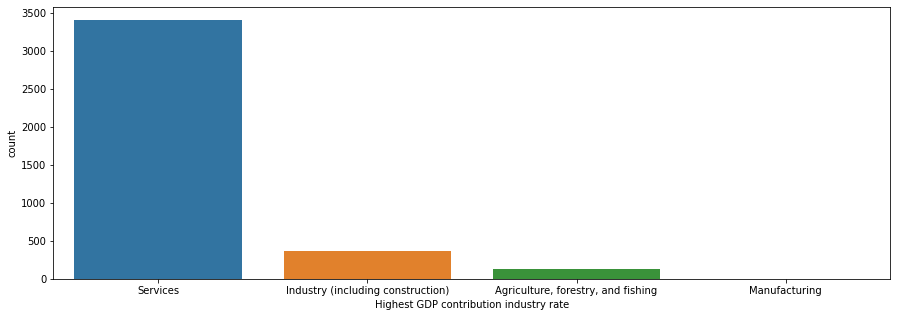

In [165]:
plt.figure(figsize=(15,5))
sns.countplot(data=data,x='Highest GDP contribution industry rate')

<Figure size 1080x360 with 0 Axes>

<AxesSubplot:xlabel='Industry has the highest employment contribution rate', ylabel='count'>

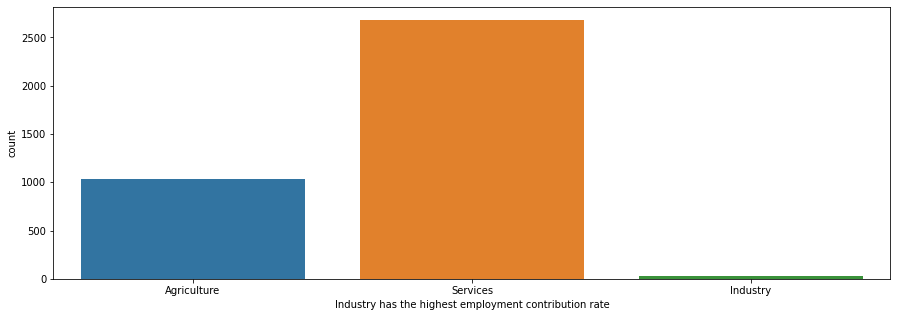

In [166]:
plt.figure(figsize=(15,5))
sns.countplot(data=data,x=data['Industry has the highest employment contribution rate'])

In [167]:
feature_list=['Industry has the highest employment contribution rate','Highest GDP contribution industry rate']

for i in feature_list:
    fig = go.Figure(data=go.Box(
        y=data['GDP growth (annual %)'],
        x=data[i],
        marker_color='darkblue',
        boxmean=True # represent mean
        )
        ,layout_yaxis_range=[-10,20]
        )
    fig.update_layout(
        width=500,
        height=700,
        xaxis_title=i,
        yaxis_title="GDP growth (annual %)")

In [168]:
"""fig = make_subplots(rows=1, cols=2)

df=data.loc[np.logical_and(data.Time==2019,data['GDP growth (annual %)']>=0),]

fig.add_trace(
    go.Scatter()
)

fig.add_trace(
    go.Scatter(x=df["Agriculture, forestry, and fishing, value added (annual % growth)"], y=df["Industry (including construction), value added (annual % growth)"],
	        mode='markers',
            marker=dict(
                    size=df['GDP growth (annual %)'],
    )),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=df["Agriculture, forestry, and fishing, value added (annual % growth)"], y=df["Industry (including construction), value added (annual % growth)"],
	        mode='markers',
            marker=dict(
                    size=df['GDP growth (annual %)'],
    )),
    row=1, col=1
)

fig.update_yaxes(range=[-5, 15])
fig.update_layout(height=600, width=800, title_text="Side By Side Subplots")
fig.show()"""

'fig = make_subplots(rows=1, cols=2)\n\ndf=data.loc[np.logical_and(data.Time==2019,data[\'GDP growth (annual %)\']>=0),]\n\nfig.add_trace(\n    go.Scatter()\n)\n\nfig.add_trace(\n    go.Scatter(x=df["Agriculture, forestry, and fishing, value added (annual % growth)"], y=df["Industry (including construction), value added (annual % growth)"],\n\t        mode=\'markers\',\n            marker=dict(\n                    size=df[\'GDP growth (annual %)\'],\n    )),\n    row=1, col=1\n)\n\nfig.add_trace(\n    go.Scatter(x=df["Agriculture, forestry, and fishing, value added (annual % growth)"], y=df["Industry (including construction), value added (annual % growth)"],\n\t        mode=\'markers\',\n            marker=dict(\n                    size=df[\'GDP growth (annual %)\'],\n    )),\n    row=1, col=1\n)\n\nfig.update_yaxes(range=[-5, 15])\nfig.update_layout(height=600, width=800, title_text="Side By Side Subplots")\nfig.show()'

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

<AxesSubplot:xlabel='Agriculture, forestry, and fishing, value added (annual % growth)', ylabel='Industry (including construction), value added (annual % growth)'>

[(-10.0, 25.0)]

[(-5.0, 15.0)]

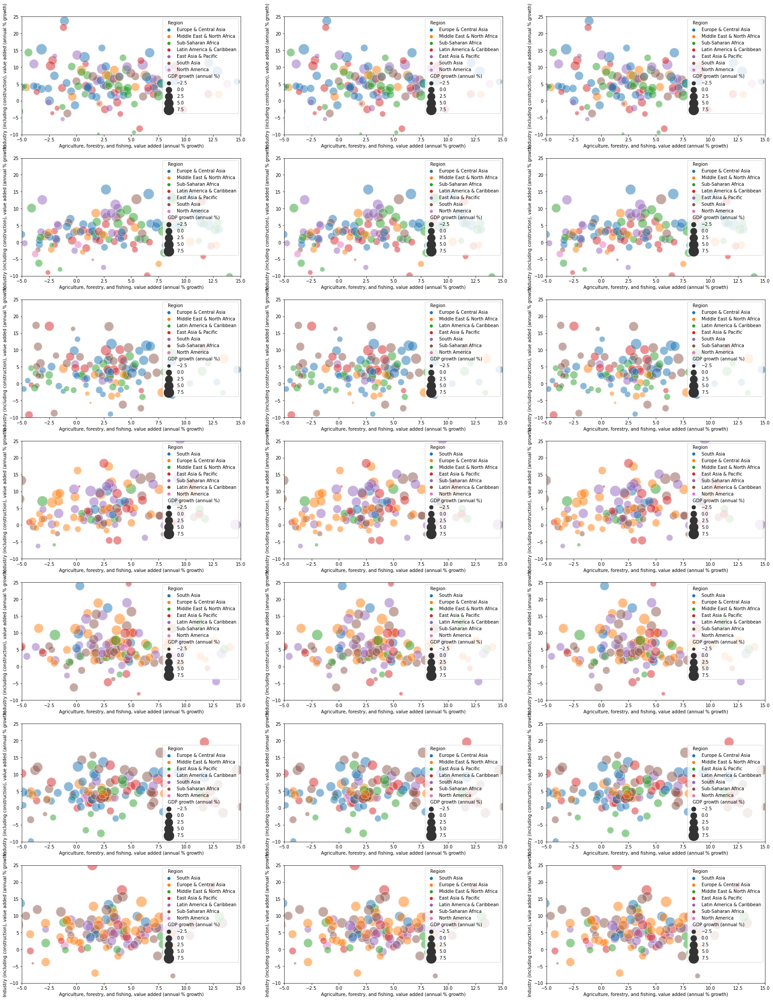

In [169]:
# bot plot với số lượng các loại trong biến
# box plot với các thuộc tính phân loại
feature_list=range(2000,2021)
k=0
fig, axs = plt.subplots(7,3,figsize=(30,40))
for i in range (0,7):
    for j in range (0,3):
        data_=data.loc[np.logical_and(data['Time']==feature_list[i],np.logical_and(data['GDP growth (annual %)']>=-5,data['GDP growth (annual %)']<=10)),]
        sns.scatterplot(data=data_, x="Agriculture, forestry, and fishing, value added (annual % growth)", y="Industry (including construction), value added (annual % growth)", size="GDP growth (annual %)",alpha=0.5,hue='Region', sizes=(10, 600),ax=axs[i,j])
        axs[i,j].set(ylim=(-10, 25))
        axs[i,j].set(xlim=(-5, 15))
        #sns.countplot(x=feature_list[k],data=data,ax=axs[i,j])
        k+=1

plt.show()
#sns.catplot(x="sex", y="survived", hue="class", kind="bar", data=titanic)

In [170]:
import plotly.express as px
import plotly.subplots as sp
from dash import dcc

# Create figures in Express
figure1 = px.scatter(data.loc[np.logical_and(data.Time==2005,data['GDP growth (annual %)']>=0),], x="Agriculture, forestry, and fishing, value added (annual % growth)", y="Industry (including construction), value added (annual % growth)",
	        size='GDP growth (annual %)', color='Region',
            hover_name="Country Name", log_x=True, size_max=60,range_y=[-5, 25])
#figure1.update_yaxes(range=[-5, 25])

figure2 = px.scatter(data.loc[np.logical_and(data.Time==2006,data['GDP growth (annual %)']>=0),], x="Services, value added (annual % growth)", y="Industry (including construction), value added (annual % growth)",
	        size='GDP growth (annual %)', color='Region',
            hover_name="Country Name", log_x=True, size_max=60,range_y=[-5, 25])
#figure2.update_yaxes(range=[-5, 25])

# For as many traces that exist per Express figure, get the traces from each plot and store them in an array.
# This is essentially breaking down the Express fig into it 's traces
figure1_traces = []
figure2_traces = []
for trace in range(len(figure1["data"])):
   figure1_traces.append(figure1["data"][trace])
for trace in range(len(figure2["data"])):
   figure2_traces.append(figure2["data"][trace])

#Create a 1 x2 subplot
this_figure = sp.make_subplots(rows = 1, cols = 2)

# Get the Express fig broken down as traces and add the traces to the proper plot within in the subplot
for traces in figure1_traces:
   this_figure.append_trace(traces, row = 1, col = 1)
for traces in figure2_traces:
   this_figure.append_trace(traces, row = 1, col = 2)

#the subplot as shown in the above image
final_graph = dcc.Graph(figure = this_figure)

In [171]:
final_graph.figure

In [172]:
fig = px.scatter(data.loc[np.logical_and(data.Time==2010,data['GDP growth (annual %)']>=0),], x="Agriculture, forestry, and fishing, value added (annual % growth)", y="Industry (including construction), value added (annual % growth)",
	        size='GDP growth (annual %)', color='Region', width=1000, height= 1000,
            hover_name="Country Name", log_x=True, size_max=60,range_x=[0.5,50],range_y=[-10, 30])

#fig.update_xaxes(range=[1.5, 4.5])
#fig.update_yaxes(range=[-5, 25])

fig.show()

In [173]:
fig = px.scatter(data.loc[np.logical_and(data.Time==2019,data['GDP growth (annual %)']>=0),], x="Agriculture, forestry, and fishing, value added (annual % growth)", y="Services, value added (annual % growth)",
	        size='GDP growth (annual %)', color='Region',
            hover_name="Country Name", log_x=True, size_max=60, range_x=[1,15],range_y=[-10,20])

#fig.update_xaxes(range=[1.5, 4.5])
#fig.update_yaxes(range=[-5, 20])

fig.show()

In [174]:
data_bins=data[['Industry (including construction), value added (annual % growth)','Services, value added (annual % growth)','Agriculture, forestry, and fishing, value added (annual % growth)','GDP growth (annual %)']]

for i in data_bins.columns.delete(-1):
    bins=[data_bins[i].min(),0,2,5,10,20,data_bins[i].max()]
    group_name=['-0','0-2','2-5','5-10','10-20','+20']
    data_bins[i]=pd.cut(data_bins[i],bins=bins,labels=group_name,include_lowest=True)

C:\Users\Admin\AppData\Local\Temp/ipykernel_15616/393980786.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [175]:
feature_list=list(data_bins.columns.delete(-1))

for i in range(len(feature_list)-1):
    for j in range(i+1,len(feature_list)):
        fig = px.line(data_frame=data_bins.groupby([feature_list[i],feature_list[j]],as_index=False).mean()
                        ,x=feature_list[i]
                        ,y='GDP growth (annual %)'
                        ,color=feature_list[j],symbol=feature_list[j],markers=True)
        fig.show()

In [176]:
fig=px.scatter(data,x="Industry (including construction), value added (annual % growth)",y='GDP growth (annual %)',trendline="ols")
fig.update_yaxes(range=[-5, 20])
#fig.show()

In [177]:
fig=px.scatter(data,x="Services, value added (annual % growth)",y='GDP growth (annual %)',trendline="ols")
fig.update_yaxes(range=[-5, 20])
#fig.show()

In [178]:
fig=px.scatter(data,x="Agriculture, forestry, and fishing, value added (annual % growth)",y='GDP growth (annual %)', trendline="ols")
fig.update_yaxes(range=[-5, 20])
#fig.show()

## Giáo dục và nghiên cứu khoa học

In [179]:
feature_list = ['Education Index','Expected Times of schooling (Times)','Mean Times of schooling (Times)','H index', 'Documents']
for i in feature_list:
    if (i=='Documents'):
        list_=['Time','Region']
        list_.append(i)
        fig=px.line(data[list_].groupby(['Time','Region'],as_index=False).sum(),x='Time',y=i,color='Region',symbol='Region',markers=True)
        fig.update_xaxes(type='category')
    else: 
        list_=['Time','Region']
        list_.append(i)
        fig=px.line(data[list_].groupby(['Time','Region'],as_index=False).mean(),x='Time',y=i,color='Region',symbol='Region',markers=True)
        fig.update_xaxes(type='category')
#fig.update_xaxes(categoryorder='array', categoryarray= ['-0','0-1','1-2','2-3'])

## Xuất nhập khẩu

In [180]:
feature_list=['Type has the highest manufacturing contribution rate','Type has the highest merchandise import contribution rate'
,'Type has the highest merchandise export contribution rate','Type has the highest service export contribution rate'
,'Type has the highest service import contribution rate']

for i in feature_list:
    fig = go.Figure(data=go.Box(
    y=data['GDP growth (annual %)'],
    x=data[i],
    marker_color='darkblue',
    boxmean=True # represent mean
    )
    ,layout_yaxis_range=[-10,20])
    fig.update_layout(
    width=600,
    height=700,
    title=i,
    yaxis_title="GDP growth (annual %)")
#fig.show()

<Figure size 1440x360 with 0 Axes>

<AxesSubplot:xlabel='Region', ylabel='Type has the highest merchandise export contribution rate'>

Text(0.5, 1.0, 'Fuel contribution')

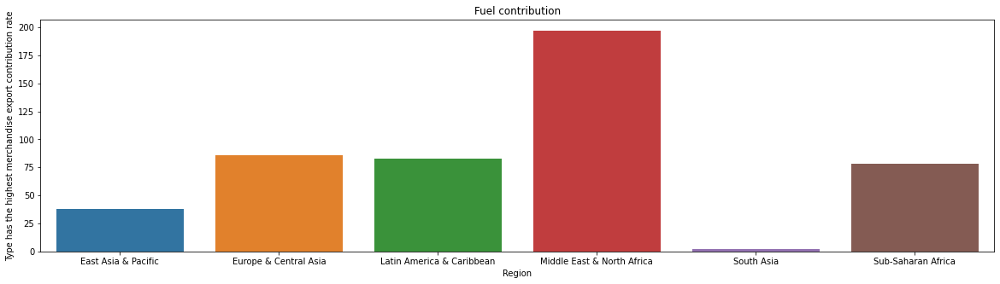

In [181]:
plt.figure(figsize=(20,5))
sns.barplot(data=data.loc[data['Type has the highest merchandise export contribution rate']=='Fuel',['Region','Type has the highest merchandise export contribution rate']].groupby(['Region'],as_index=False).count(),x='Region',y='Type has the highest merchandise export contribution rate')
plt.title('Fuel contribution')

<Figure size 1440x360 with 0 Axes>

<AxesSubplot:xlabel='Region', ylabel='Type has the highest merchandise export contribution rate'>

Text(0.5, 1.0, 'Fuel contribution')

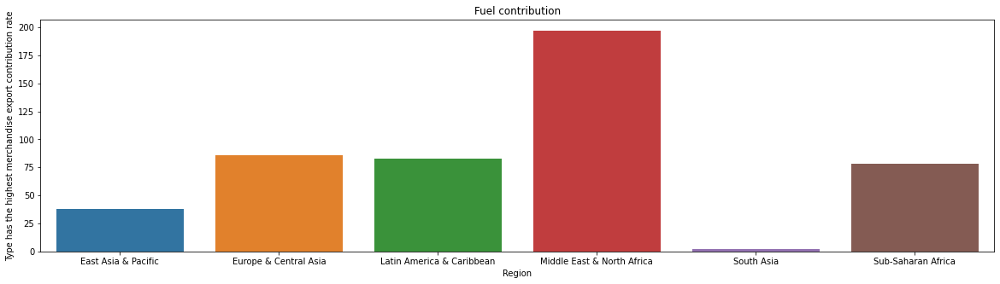

In [182]:
plt.figure(figsize=(20,5))
sns.barplot(data=data.loc[data['Type has the highest merchandise export contribution rate']=='Fuel',['Region','Type has the highest merchandise export contribution rate']].groupby(['Region'],as_index=False).count(),x='Region',y='Type has the highest merchandise export contribution rate')
plt.title('Fuel contribution')

In [183]:
feature_list=['Type has the highest merchandise export contribution rate','Type has the highest manufacturing contribution rate','Type has the highest merchandise import contribution rate'
,'Type has the highest service export contribution rate'
,'Type has the highest service import contribution rate','Type has the highest commercial service export contribution rate'
,'Type has the highest commercial service import contribution rate']

for i in range(0,6):
    for j in range (i+1,7):
        list_=['GDP growth (annual %)']
        list_.extend([feature_list[i],feature_list[j]])
        fig=px.line(data[list_].groupby([feature_list[i],feature_list[j]],as_index=False).mean(),x=feature_list[i],y='GDP growth (annual %)',color=feature_list[j],symbol=feature_list[j],markers=True)
        fig.update_xaxes(type='category')
    #fig.update_xaxes(categoryorder='array', categoryarray= ['-0','0-1','1-2','2-3'])

In [184]:
fig=px.scatter(data_frame=data,x=data['Export value index (2000 = 100)'],y=data['GDP growth (annual %)'], trendline="ols",range_x=[0,2000])
fig.show()

In [185]:
fig=px.scatter(data_frame=data,x=data['Import value index (2000 = 100)'],y=data['GDP growth (annual %)'], trendline="ols",range_x=[0,2000])
fig.show()

In [186]:
fig = px.scatter(data.loc[np.logical_and(data.Time==2018,data['GDP growth (annual %)']>=0),], x='Import value index (2000 = 100)', y='Export value index (2000 = 100)',
	        size='GDP growth (annual %)', color='Region',
            hover_name="Country Name", log_x=True, size_max=60, range_x=[100,1500],range_y=[-2000,4000])
fig.show()

## Các chỉ số kinh tế vĩ mô khác

In [187]:
feature_list=['Gross value added at basic prices (GVA) (current US$)'
,'Inflation, GDP deflator (annual %)'
,'GNI growth (annual %)'
,'Stocks traded, total value (% of GDP)'
,'Consumer price index (2010 = 100)'
,'Foreign direct investment, net inflows (% of GDP)'
,'Total reserves (includes gold, current US$)'
,'Lending interest rate (%)'
,'Deposit interest rate (%)'
,'Net ODA received (% of GNI)'
,'GDP growth (annual %)']

In [188]:
data_bins=data[['Inflation, GDP deflator (annual %)'
,'GNI growth (annual %)'
,'Stocks traded, total value (% of GDP)'
,'Foreign direct investment, net inflows (% of GDP)'
,'Lending interest rate (%)'
,'Deposit interest rate (%)'
,'Net ODA received (% of GNI)'
,'Unemployment, total (% of total labor force) (modeled ILO estimate)'
,'GDP growth (annual %)']]

for i in data_bins.columns.delete([-1,-2]):
    print(data_bins[i].min(),data_bins[i].max())
    try:
        bins=[data_bins[i].min(),0,5,10,20,50,data_bins[i].max()]
        group_name=['-0','0-5','5-10','10-20','20-50','50+']
        data_bins[i]=pd.cut(data_bins[i],bins=bins,labels=group_name,include_lowest=True)
    except:
        bins=[data_bins[i].min(),5,10,20,data_bins[i].max()]
        group_name=['0-5','5-10','10-20','+20']
        data_bins[i]=pd.cut(data_bins[i],bins=bins,labels=group_name,include_lowest=True)

-30.1996539393789 2630.1226744224
-36.1606570252006 47.9770399735136
0.0008575354198056 952.667323279516
-1275.1899856739 1704.5901335991
0.0 118.379940833333
-0.383657405833333 203.375
-2.31257927096713 92.1414597696677


C:\Users\Admin\AppData\Local\Temp/ipykernel_15616/2015142151.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp/ipykernel_15616/2015142151.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<AxesSubplot:xlabel='Inflation, GDP deflator (annual %)', ylabel='count'>

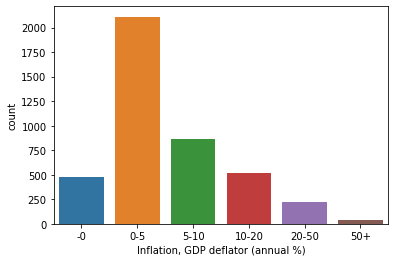

In [189]:
sns.countplot(data=data_bins,x='Inflation, GDP deflator (annual %)')

In [190]:
fig = px.line(data_frame=data_bins.groupby(['Inflation, GDP deflator (annual %)','Lending interest rate (%)'],as_index=False).mean()
                        ,x='Inflation, GDP deflator (annual %)'
                        ,y='GDP growth (annual %)'
                        ,color='Lending interest rate (%)',symbol='Lending interest rate (%)',markers=True)
fig.show()

In [191]:
fig = px.line(data_frame=data_bins.groupby(['Inflation, GDP deflator (annual %)','Deposit interest rate (%)'],as_index=False).mean()
                        ,x='Inflation, GDP deflator (annual %)'
                        ,y='GDP growth (annual %)'
                        ,color='Deposit interest rate (%)',symbol='Deposit interest rate (%)',markers=True)
fig.show()

In [192]:
fig=px.scatter(data,x='Inflation, GDP deflator (annual %)',y='Unemployment, total (% of total labor force) (modeled ILO estimate)')

fig.show()

In [193]:
for i in data_bins.columns.delete([-1,-2]):
    fig = go.Figure(data=go.Box(
        y=data_bins['Unemployment, total (% of total labor force) (modeled ILO estimate)'],
        x=data_bins[i],
        marker_color='darkblue',
        boxmean=True # represent mean
        )
        ,layout_yaxis_range=[0,30]
        )
    fig.update_layout(
        width=500,
        height=700,
        xaxis_title=i,
        yaxis_title="Unemployment, total (% of total labor force) (modeled ILO estimate)",)

In [194]:
for i in data_bins.columns.delete([-1,-2]):
    fig = go.Figure(data=go.Box(
        y=data_bins['GDP growth (annual %)'],
        x=data_bins[i],
        marker_color='darkblue',
        boxmean=True # represent mean
        )
        ,layout_yaxis_range=[-10,20]
        )
    fig.update_layout(
        width=500,
        height=700,
        xaxis_title=i,
        yaxis_title="GDP growth (annual %)",)

In [195]:
for i in data_bins.columns.delete([-1,-2]):
    fig = go.Figure(data=go.Box(
        y=data_bins['Consumer price index (2010 = 100)'],
        x=data_bins[i],
        marker_color='darkblue',
        boxmean=True # represent mean
        )
        ,layout_yaxis_range=[-10,200]
        )
    fig.update_layout(
        width=500,
        height=700,
        xaxis_title=i,
        yaxis_title="Consumer price index (2010 = 100)",)

KeyError: 'Consumer price index (2010 = 100)'

In [196]:
data_=data[['Country Name','GDP growth (annual %)']].groupby(['Country Name'],as_index=False).mean().nlargest(10,'GDP growth (annual %)').drop(columns='GDP growth (annual %)',axis=1).merge(data,how='left',on=['Country Name'])


fig=px.line(data_[['Time','Country Name', 'Consumer price index (2010 = 100)']],x='Time',y='Consumer price index (2010 = 100)',color='Country Name')
fig.show()

In [197]:
data_=data[['Country Name','GDP growth (annual %)']].groupby(['Country Name'],as_index=False).mean().nsmallest(10,'GDP growth (annual %)').drop(columns='GDP growth (annual %)',axis=1).merge(data,how='left',on=['Country Name'])


fig=px.line(data_[['Time','Country Name', 'Consumer price index (2010 = 100)']],x='Time',y='Consumer price index (2010 = 100)',color='Country Name')
fig.show()

# Preprocessing

## Chuyển kiểu dữ liệu

In [198]:
data['Time']=pd.to_datetime(data.Time,format='%Y')

data['Time'] = pd.DatetimeIndex(data['Time']).year

In [199]:
data.Time

0       2000
1       2000
2       2000
3       2000
4       2000
5       2000
6       2000
7       2000
8       2000
9       2000
10      2000
11      2000
12      2000
13      2000
14      2000
15      2000
16      2000
17      2000
18      2000
19      2000
20      2000
21      2000
22      2000
23      2000
24      2000
25      2000
26      2000
27      2000
28      2000
29      2000
30      2000
31      2000
32      2000
33      2000
34      2000
35      2000
36      2000
37      2000
38      2000
39      2000
40      2000
41      2000
42      2000
43      2000
44      2000
45      2000
46      2000
47      2000
48      2000
49      2000
50      2000
51      2000
52      2000
53      2000
54      2000
55      2000
56      2000
57      2000
58      2000
59      2000
60      2000
61      2000
62      2000
63      2000
64      2000
65      2000
66      2000
67      2000
68      2000
69      2000
70      2000
71      2000
72      2000
73      2000
74      2000
75      2000
76      2000

In [200]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4557 entries, 0 to 4556
Data columns (total 48 columns):
 #   Column                                                               Non-Null Count  Dtype  
---  ------                                                               --------------  -----  
 0   Time                                                                 4557 non-null   int64  
 1   Country Name                                                         4557 non-null   object 
 2   Region                                                               4557 non-null   object 
 3   Population, total                                                    4548 non-null   float64
 4   Population Structure                                                 4065 non-null   object 
 5   Population growth                                                    4548 non-null   object 
 6   Unemployment, total (% of total labor force) (modeled ILO estimate)  3927 non-null   float64
 7   Labor 

## Fill NA

In [312]:
data_c=data.copy()

In [313]:
data_c.isna().sum()

Time                                                                   0   
Country Name                                                           0   
Region                                                                 0   
Population, total                                                      9   
Population Structure                                                   492 
Population growth                                                      9   
Unemployment, total (% of total labor force) (modeled ILO estimate)    630 
Labor force, total                                                     630 
Life expectancy index                                                  737 
Life expectancy at birth (Times)                                       737 
HDI                                                                    868 
Highest GDP contribution industry rate                                 659 
Industry has the highest employment contribution rate                  817 
Agriculture,

In [314]:
# Loại bỏ các cột có missing nhiều (trên 2/3 số lượng bị mất) (chưa chắc cần lập luận thêm để chứng minh)
for i in data_c.columns:
    if data_c[i].isna().sum()/len(data.index)*100>75:
        data_c.drop(i,axis=1,inplace=True)

In [315]:
# Loại bỏ các nước có số lượng missing nhiều (đúng)
arr=[]
for i in data_c['Country Name'].unique():
    count=0
    for j in data_c.loc[data_c['Country Name']==i,].isna().sum()/21*100:
        if j>=50:
            count+=1
    if (count>=23):
        arr.append(i)
        arr.append(count)
        data_c.drop(data_c[data_c['Country Name'] == i].index, inplace = True)
        print(i)


American Samoa
Andorra
Bermuda
Virgin Islands (British)
Cayman Islands
Channel Islands
Curacao
Faroe Islands
French Polynesia
Gibraltar
Greenland
Guam
Isle of Man
North Korea
Liechtenstein
Monaco
Nauru
New Caledonia
Northern Mariana Islands
Puerto Rico
San Marino
Sint Maarten (Dutch part)
Somalia
Republic of South Sudan
Martinique
Turks and Caicos Islands
Tuvalu
Virgin Islands (U.S.)


In [316]:
"""# def fill_missing_value_with_means(i,j):
i='Viet Nam' 
y=2000
for j in data_c.select_dtypes(exclude=object).columns:
    if (data_c.loc[data_c['Country Name']==i,j].isna().sum()!=21):
            print(j,np.mean(data_c.loc[data_c['Country Name']==i,j])) # điền mean theo cột đó trong quốc gia đó
    else:
            data_cc=data_c.groupby('Region')
            x=data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==2000),'Region']
            x=x.iloc[0]
            data_cc=data_cc.get_group(x)
            values=np.mean(data_cc.loc[data_cc['Time']==y,j])
            if (values==np.nan):
                print(j,np.mean(data_c[j]))
            else :
                print(j,values) """
        

"# def fill_missing_value_with_means(i,j):\ni='Viet Nam' \ny=2000\nfor j in data_c.select_dtypes(exclude=object).columns:\n    if (data_c.loc[data_c['Country Name']==i,j].isna().sum()!=21):\n            print(j,np.mean(data_c.loc[data_c['Country Name']==i,j])) # điền mean theo cột đó trong quốc gia đó\n    else:\n            data_cc=data_c.groupby('Region')\n            x=data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==2000),'Region']\n            x=x.iloc[0]\n            data_cc=data_cc.get_group(x)\n            values=np.mean(data_cc.loc[data_cc['Time']==y,j])\n            if (values==np.nan):\n                print(j,np.mean(data_c[j]))\n            else :\n                print(j,values) "

In [317]:
"""def fill_missing_value_with_means(i,j,y):
    if (data_c.loc[data_c['Country Name']==i,j].isna().sum()<20):
            return(np.mean(data_c.loc[data_c['Country Name']==i,j])) # điền mean theo cột đó trong quốc gia đó
    else:
            data_cc=data_c.groupby('Region')
            x=data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==y),'Region']
            x=x.iloc[0]
            data_cc=data_cc.get_group(x)
            values=np.mean(data_cc.loc[data_cc['Time']==y,j])
            if (str(values)=='nan'):
                return(np.mean(data_c[j]))
            else :
                return(values)
"""

"def fill_missing_value_with_means(i,j,y):\n    if (data_c.loc[data_c['Country Name']==i,j].isna().sum()<20):\n            return(np.mean(data_c.loc[data_c['Country Name']==i,j])) # điền mean theo cột đó trong quốc gia đó\n    else:\n            data_cc=data_c.groupby('Region')\n            x=data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==y),'Region']\n            x=x.iloc[0]\n            data_cc=data_cc.get_group(x)\n            values=np.mean(data_cc.loc[data_cc['Time']==y,j])\n            if (str(values)=='nan'):\n                return(np.mean(data_c[j]))\n            else :\n                return(values)\n"

In [318]:
""" data_cc=data_c.groupby('Region')
#x=data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==2020),'Region']
#x=x.iloc[0]
for x in data_c['Region'].unique():
    if (str(x)!='nan'):
        data_ccc=data_cc.get_group(x)
        #print(data_ccc)
        y=data_ccc.loc[data_ccc['Time']==2000,'Central government debt, total (% of GDP)']
        values=np.mean(y)
        print(values,'-')
        y=data_ccc.loc[data_ccc['Time']==2020,'Central government debt, total (% of GDP)']
        values=np.mean(y)
        print(values) """

" data_cc=data_c.groupby('Region')\n#x=data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==2020),'Region']\n#x=x.iloc[0]\nfor x in data_c['Region'].unique():\n    if (str(x)!='nan'):\n        data_ccc=data_cc.get_group(x)\n        #print(data_ccc)\n        y=data_ccc.loc[data_ccc['Time']==2000,'Central government debt, total (% of GDP)']\n        values=np.mean(y)\n        print(values,'-')\n        y=data_ccc.loc[data_ccc['Time']==2020,'Central government debt, total (% of GDP)']\n        values=np.mean(y)\n        print(values) "

In [319]:
"""i='Viet Nam'
j='Stocks traded, total value (% of GDP)'
x1=0
x2=0
y=2000

if (y==2000):
    x1=data_c.loc[np.logical_and(data_c[j].notna(),data_c['Country Name']==i),'Time'].iloc[0]
    x2=data_c.loc[np.logical_and(data_c[j].notna(),data_c['Country Name']==i),'Time'].iloc[1]
    y1=data_c.loc[np.logical_and(data_c['Time']==x1, data['Country Name']==i),j].iloc[0]
    y2=data_c.loc[np.logical_and(data_c['Time']==x2, data['Country Name']==i),j].iloc[0]
    print(x1,x2,y1,y2)
    print (y1+((2000-x1)*((y2-y1)/(x2-x1))))
if (y==2020):
    x1=data_c.loc[np.logical_and(data_c[j].notna(),data_c['Country Name']==i),'Time'].iloc[-1]
    x2=data_c.loc[np.logical_and(data_c[j].notna(),data_c['Country Name']==i),'Time'].iloc[-2]
    y1=data_c.loc[np.logical_and(data_c['Time']==x1, data['Country Name']==i),j].iloc[0]
    y2=data_c.loc[np.logical_and(data_c['Time']==x2, data['Country Name']==i),j].iloc[0]
    print (y1+((2000-x1)*((y2-y1)/(x2-x1)))) """

"i='Viet Nam'\nj='Stocks traded, total value (% of GDP)'\nx1=0\nx2=0\ny=2000\n\nif (y==2000):\n    x1=data_c.loc[np.logical_and(data_c[j].notna(),data_c['Country Name']==i),'Time'].iloc[0]\n    x2=data_c.loc[np.logical_and(data_c[j].notna(),data_c['Country Name']==i),'Time'].iloc[1]\n    y1=data_c.loc[np.logical_and(data_c['Time']==x1, data['Country Name']==i),j].iloc[0]\n    y2=data_c.loc[np.logical_and(data_c['Time']==x2, data['Country Name']==i),j].iloc[0]\n    print(x1,x2,y1,y2)\n    print (y1+((2000-x1)*((y2-y1)/(x2-x1))))\nif (y==2020):\n    x1=data_c.loc[np.logical_and(data_c[j].notna(),data_c['Country Name']==i),'Time'].iloc[-1]\n    x2=data_c.loc[np.logical_and(data_c[j].notna(),data_c['Country Name']==i),'Time'].iloc[-2]\n    y1=data_c.loc[np.logical_and(data_c['Time']==x1, data['Country Name']==i),j].iloc[0]\n    y2=data_c.loc[np.logical_and(data_c['Time']==x2, data['Country Name']==i),j].iloc[0]\n    print (y1+((2000-x1)*((y2-y1)/(x2-x1)))) "

In [320]:
# Điền missing (bằng phép nội suy)
for i in data_c['Country Name'].unique():
    print(i)
    data_c.update(data_c.loc[data_c['Country Name']==i,].interpolate(method='linear', inplace=False, limit_direction='both', limit_area='inside'))

Afghanistan
Albania
Algeria
Angola
Antigua and Barbuda
Argentina
Armenia
Aruba
Australia
Austria
Azerbaijan
Bahamas
Bahrain
Bangladesh
Barbados
Belarus
Belgium
Belize
Benin
Bhutan
Bolivia
Bosnia and Herzegovina
Botswana
Brazil
Brunei Darussalam
Bulgaria
Burkina Faso
Burundi
Cabo Verde
Cambodia
Cameroon
Canada
Central African Republic
Chad
Chile
China
Colombia
Comoros
Democratic Republic Congo
Congo
Costa Rica
Côte d’Ivoire
Croatia
Cuba
Cyprus
Czech Republic
Denmark
Djibouti
Dominica
Dominican Republic
Ecuador
Egypt
El Salvador
Equatorial Guinea
Eritrea
Estonia
Eswatini
Ethiopia
Fiji
Finland
France
Gabon
Gambia
Georgia
Germany
Ghana
Greece
Grenada
Guatemala
Guinea
Guinea-Bissau
Guyana
Haïti
Honduras
Hong Kong
Hungary
Iceland
India
Indonesia
Iran
Iraq
Ireland
Israel
Italy
Jamaica
Japan
Jordan
Kazakhstan
Kenya
Kiribati
South Korea
Kosovo
Kuwait
Kyrgyzstan
Laos
Latvia
Lebanon
Lesotho
Liberia
Libya
Lithuania
Luxembourg
Macao
Madagascar
Malawi
Malaysia
Maldives
Mali
Malta
Marshall Islands
Ma

In [321]:
data_c=data_c.reset_index(drop=True)

In [322]:
data_numeric=data_c.select_dtypes(exclude=object)

from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)

data_numeric = pd.DataFrame(imputer.fit_transform(data_numeric),columns = data_numeric.columns)

In [323]:
for i in data_c.select_dtypes(exclude=object):
    data_c[i].update(data_numeric[i])

In [324]:
data_c.isna().sum()

Time                                                                   0   
Country Name                                                           0   
Region                                                                 0   
Population, total                                                      0   
Population Structure                                                   114 
Population growth                                                      9   
Unemployment, total (% of total labor force) (modeled ILO estimate)    0   
Labor force, total                                                     0   
Life expectancy index                                                  0   
Life expectancy at birth (Times)                                       0   
HDI                                                                    330 
Highest GDP contribution industry rate                                 236 
Industry has the highest employment contribution rate                  409 
Agriculture,

In [325]:
"""# Điền missing (bằng phép nội suy)
for i in data_c['Country Name'].unique():
    print(i)
    for j in data_c.select_dtypes(exclude=object).columns:
        if data_c[j].isna().sum()!=0:
            x=data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==2000),j]
            x=x.iloc[0]
            if str(x)=='nan':
                data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==2000),j]=fill_missing_value_with_means(i,j,2000)
            y=data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==2020),j]
            y=y.iloc[0]
            if str(y)=="nan":
                data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==2020),j]=fill_missing_value_with_means(i,j,2020)
        
        data_c.update(data_c.loc[data_c['Country Name']==i,j].interpolate(method='linear', inplace=False, limit_direction='both', limit_area='inside'))"""

'# Điền missing (bằng phép nội suy)\nfor i in data_c[\'Country Name\'].unique():\n    print(i)\n    for j in data_c.select_dtypes(exclude=object).columns:\n        if data_c[j].isna().sum()!=0:\n            x=data_c.loc[np.logical_and(data_c[\'Country Name\']==i, data[\'Time\']==2000),j]\n            x=x.iloc[0]\n            if str(x)==\'nan\':\n                data_c.loc[np.logical_and(data_c[\'Country Name\']==i, data[\'Time\']==2000),j]=fill_missing_value_with_means(i,j,2000)\n            y=data_c.loc[np.logical_and(data_c[\'Country Name\']==i, data[\'Time\']==2020),j]\n            y=y.iloc[0]\n            if str(y)=="nan":\n                data_c.loc[np.logical_and(data_c[\'Country Name\']==i, data[\'Time\']==2020),j]=fill_missing_value_with_means(i,j,2020)\n        \n        data_c.update(data_c.loc[data_c[\'Country Name\']==i,j].interpolate(method=\'linear\', inplace=False, limit_direction=\'both\', limit_area=\'inside\'))'

In [326]:
# Điền missing biến phân loại (mode có sự khác biệt)
for i in data_c['Country Name'].unique():
    print(i)
    for j in data_c.select_dtypes(include=object).columns:
        if data_c.loc[data_c['Country Name']==i,j].isna().sum()!=0:
            if (data_c.loc[data_c['Country Name']==i,j].isna().sum()<20):
                data_c.loc[data_c['Country Name']==i,j]=data_c.loc[data_c['Country Name']==i,j].fillna(data_c.loc[data_c['Country Name']==i,j].mode(dropna=True)[0],inplace=False)
            else:
                data_cc=data_c.groupby('Region')
                x=data_c.loc[np.logical_and(data_c['Country Name']==i, data['Time']==2000),'Region']
                x=x.iloc[0]
                data_cc=data_cc.get_group(x)
                for t in data_c.loc[data_c['Country Name']==i,j].index:
                    if (str(data_c[j][t])=='nan'):
                        try:
                            data_c[j][t]=data_cc.loc[data_cc['Time']==data_c['Time'][t],j].mode(dropna=True)[0] # Điền bằng mode của năm đó, khu vực đó
                        except :
                            pass
                    if (str(data_c[j][t])=='nan'):
                        try:
                            data_c[j][t]=data_cc[j].mode(dropna=True)[0] # Điền bằng Mode của khu vực đó trong tất cả các năm
                        except :
                            pass
                    if (str(data_c[j][t])=='nan'):
                        try:
                            data_c[j][t]=data_c.loc[data_c['Time']==data_c['Time'][t],j].mode(dropna=True)[0] # Điền bằng mode của năm đó toàn thế giới
                        except :
                            pass
                    if (str(data_c[j][t])=='nan'):
                        try:
                            data_c[j][t]=data_c[j].mode(dropna=True)[0] # điền bằng mode của thế giới trong tất cả các năm
                        except:
                            pass


Afghanistan
Albania


C:\Users\Admin\AppData\Local\Temp/ipykernel_15616/2201818259.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp/ipykernel_15616/2201818259.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Algeria
Angola
Antigua and Barbuda
Argentina
Armenia
Aruba
Australia
Austria
Azerbaijan
Bahamas
Bahrain
Bangladesh
Barbados
Belarus
Belgium
Belize
Benin
Bhutan
Bolivia
Bosnia and Herzegovina
Botswana
Brazil
Brunei Darussalam
Bulgaria
Burkina Faso
Burundi
Cabo Verde
Cambodia
Cameroon
Canada
Central African Republic
Chad
Chile
China
Colombia
Comoros
Democratic Republic Congo
Congo
Costa Rica
Côte d’Ivoire
Croatia
Cuba
Cyprus
Czech Republic
Denmark
Djibouti
Dominica
Dominican Republic
Ecuador
Egypt
El Salvador
Equatorial Guinea
Eritrea
Estonia
Eswatini
Ethiopia
Fiji
Finland
France
Gabon
Gambia
Georgia
Germany
Ghana
Greece
Grenada
Guatemala
Guinea
Guinea-Bissau
Guyana
Haïti
Honduras
Hong Kong
Hungary
Iceland
India
Indonesia
Iran
Iraq
Ireland
Israel
Italy
Jamaica
Japan
Jordan
Kazakhstan
Kenya
Kiribati
South Korea
Kosovo
Kuwait
Kyrgyzstan
Laos
Latvia
Lebanon
Lesotho
Liberia
Libya
Lithuania
Luxembourg
Macao
Madagascar
Malawi
Malaysia
Maldives
Mali
Malta
Marshall Islands
Mauritania
Mauritius
M

In [327]:
data_c.isna().sum()

Time                                                                   0
Country Name                                                           0
Region                                                                 0
Population, total                                                      0
Population Structure                                                   0
Population growth                                                      0
Unemployment, total (% of total labor force) (modeled ILO estimate)    0
Labor force, total                                                     0
Life expectancy index                                                  0
Life expectancy at birth (Times)                                       0
HDI                                                                    0
Highest GDP contribution industry rate                                 0
Industry has the highest employment contribution rate                  0
Agriculture, forestry, and fishing, value added (an

In [328]:
data=data_c.copy()

In [329]:
data.describe()

,Time,"Population, total","Unemployment, total (% of total labor force) (modeled ILO estimate)","Labor force, total",Life expectancy index,Life expectancy at birth (Times),"Agriculture, forestry, and fishing, value added (annual % growth)","Industry (including construction), value added (annual % growth)","Services, value added (annual % growth)","Manufacturing, value added (annual % growth)",Gross value added at basic prices (GVA) (current US$),Total natural resources rents (% of GDP),"Inflation, GDP deflator (annual %)",GNI growth (annual %),"Stocks traded, total value (% of GDP)",Broad money (% of GDP),Consumer price index (2010 = 100),Net ODA received (% of GNI),"Foreign direct investment, net inflows (% of GDP)","Official exchange rate (LCU per US$, period average)","Total reserves (includes gold, current US$)",Trade (% of GDP),Lending interest rate (%),Deposit interest rate (%),Import value index (2000 = 100),Export value index (2000 = 100),Education Index,Documents,H index,Expected Times of schooling (Times),Mean Times of schooling (Times),GDP growth (annual %)
count,3969.000000,3.969000e+03,3969.000000,3.969000e+03,3969.000000,3969.000000,3969.000000,3969.000000,3969.000000,3969.000000,3.969000e+03,3969.000000,3969.000000,3969.000000,3969.000000,3969.000000,3969.000000,3969.000000,3969.000000,3.969000e+03,3.969000e+03,3969.000000,3969.000000,3969.000000,3969.000000,3969.000000,3969.000000,3969.00000,3969.000000,3969.000000,3969.000000,3969.000000
mean,2010.000000,3.625247e+07,7.946805,1.647900e+07,0.758839,69.324439,2.311446,3.802764,3.795621,3.308746,2.579314e+11,7.379094,7.334761,3.504980,16.262597,54.529598,104.905147,6.115309,5.557441,1.103915e+07,4.936530e+10,88.702095,11.661339,6.330879,301.098565,327.680759,0.600499,14890.12963,280.973998,12.369499,7.766601,3.460618
std,6.056064,1.360292e+08,5.897437,6.683634e+07,0.139764,9.084508,8.627981,9.765003,5.439688,11.268449,1.134447e+12,11.494444,44.979261,4.424006,51.862680,42.062250,83.451048,7.264167,15.780469,2.264926e+08,2.150359e+11,52.734371,8.848780,7.114798,217.965551,547.028509,0.180381,58493.60583,350.006546,3.071036,3.129670,5.564622
min,2000.000000,1.760300e+04,0.110000,3.120500e+04,0.299000,39.400000,-45.850916,-75.045642,-33.233197,-80.074608,0.000000e+00,0.000000,-30.199654,-36.160657,0.000858,2.857408,2.909082,-2.312579,-58.322880,4.446838e-02,2.677074e+05,0.167418,0.000000,-0.383657,25.404192,5.179590,0.116000,1.00000,15.000000,2.900000,1.100000,-62.075920
25%,2005.000000,1.959537e+06,3.840000,9.935900e+05,0.667000,63.400000,-0.879601,0.151132,1.457235,-0.042703,4.463672e+09,0.372367,1.481830,1.495217,0.177566,26.373916,82.231796,0.951848,1.285454,2.700000e+00,6.321330e+08,56.862736,5.641167,3.011667,148.099161,128.928814,0.462400,74.00000,73.000000,10.500000,5.200000,1.444036
50%,2010.000000,7.339001e+06,6.620000,3.186577e+06,0.793000,71.500000,2.531869,3.211893,3.670220,2.937419,1.851919e+10,2.127252,3.779619,3.444584,0.864656,42.018530,100.000000,4.532711,3.038291,2.035378e+01,3.702502e+09,79.081369,9.216667,5.225000,236.178207,218.154189,0.619000,487.00000,140.000000,12.500000,7.900000,3.654371
75%,2015.000000,2.472562e+07,10.180000,9.560071e+06,0.859000,75.800000,5.478298,6.997928,6.183646,6.514992,1.212879e+11,9.432766,8.153730,5.695644,6.712485,69.718738,113.050800,8.241268,5.880659,4.721940e+02,2.810364e+10,105.962029,15.534140,8.000000,386.752042,366.286422,0.737000,5572.00000,322.000000,14.500000,10.400000,5.908336
max,2020.000000,1.402112e+09,37.250000,7.871832e+08,0.998000,84.900000,91.606197,162.671358,97.465837,375.157680,1.983795e+13,87.459309,2630.122674,47.977040,952.667323,452.548038,3364.819937,92.141460,449.082766,6.723052e+09,3.900039e+12,442.620019,118.379941,203.375000,1909.586541,14708.270350,0.943000,788287.00000,2577.000000,23.300000,14.200000,123.139555


## Xử lý outlier (nên xử lý sau khi phân tích)

In [341]:
data_c=data.copy()

In [342]:
Q1 = data_c.iloc[:,4:].quantile(0.25)
Q3 = data_c.iloc[:,4:].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Unemployment, total (% of total labor force) (modeled ILO estimate)    6.340000e+00
Labor force, total                                                     8.566481e+06
Life expectancy index                                                  1.920000e-01
Life expectancy at birth (Times)                                       1.240000e+01
Agriculture, forestry, and fishing, value added (annual % growth)      6.357899e+00
Industry (including construction), value added (annual % growth)       6.846796e+00
Services, value added (annual % growth)                                4.726411e+00
Manufacturing, value added (annual % growth)                           6.557696e+00
Gross value added at basic prices (GVA) (current US$)                  1.168243e+11
Total natural resources rents (% of GDP)                               9.060400e+00
Inflation, GDP deflator (annual %)                                     6.671900e+00
GNI growth (annual %)                                                  4.200

In [344]:
for i in data_c.iloc[:,4:].select_dtypes(exclude=object).columns:
    lower=Q1[i]-1.5*IQR[i]
    upper=Q3[i]+1.5*IQR[i]
    print(lower, upper)
    data_c[i]=np.where(data_c[i]<lower,lower,np.where(data_c[i]>upper,upper,data_c[i]))
    

-5.67 19.689999999999998
-11856131.5 22409792.5
0.3790000000000001 1.1469999999999998
44.8 94.39999999999999
-10.416448594295831 15.01514597507497
-10.11906228118471 17.268122560004105
-5.632381545521707 13.27326237746944
-9.87924690539343 16.351535607585546
-170772703688.385 296524299001.5654
-13.218232848193946 23.023365577690384
-8.526020201810912 18.16157982749597
-4.805422868971754 11.996284125236045
-9.624812799698207 16.51486400183809
-38.64331846350689 134.73597264240908
36.003290158441246 159.27930613630645
-9.982283040777824 19.17539939039233
-5.60735435104457 12.77346735222239
-701.5410213577298 1176.4350355962165
-40575121665.19275 69310890887.65677
-16.786203456750222 179.61096816940744
-9.198293636320727 30.373600504978995
-4.470833333333324 15.482499999999995
-209.88016151000005 744.73136465
-227.10759700000003 722.3228334
0.050499999999999934 1.1489
-8173.0 13819.0
-300.5 695.5
4.5 20.5
-2.6000000000000005 18.200000000000003
-5.252412492297896 12.604784790871346


In [345]:
data=data_c

# Build Model